Epoch 1/10
GenG: 5.4922, GenF: 5.3901, DiscX: 0.5052, DiscY: 0.4695


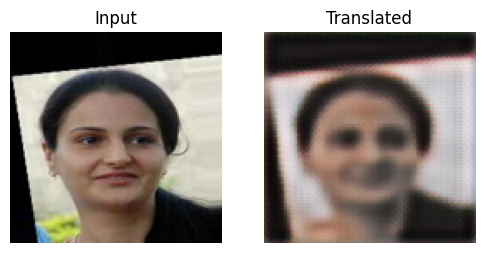

Epoch 2/10
GenG: 4.8521, GenF: 4.7394, DiscX: 0.4375, DiscY: 0.2790


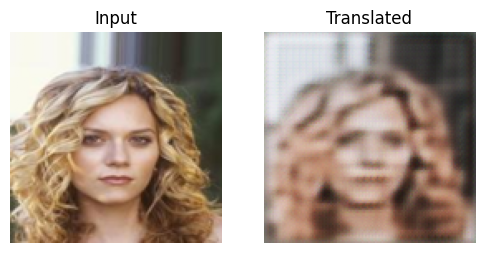

Epoch 3/10
GenG: 4.0969, GenF: 4.3341, DiscX: 0.4361, DiscY: 0.4308


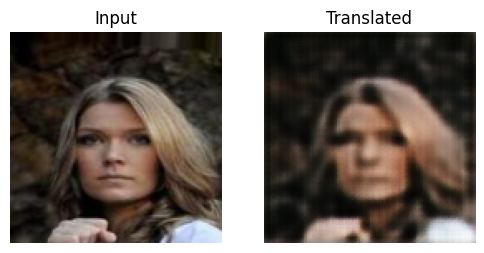

Epoch 4/10
GenG: 4.0520, GenF: 4.1129, DiscX: 0.3661, DiscY: 0.4178


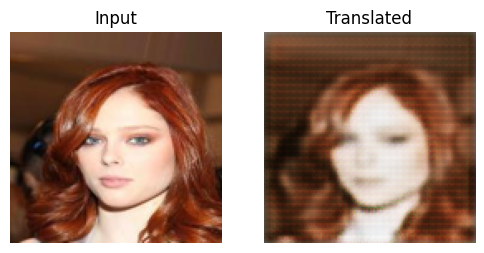

Epoch 5/10
GenG: 3.2289, GenF: 3.2518, DiscX: 0.5215, DiscY: 0.3915


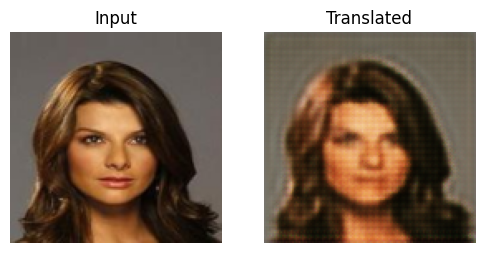

Epoch 6/10
GenG: 3.6215, GenF: 3.6857, DiscX: 0.4219, DiscY: 0.4654


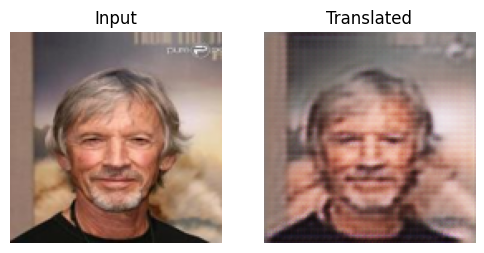

Epoch 7/10
GenG: 2.7417, GenF: 2.6549, DiscX: 0.4409, DiscY: 0.3723


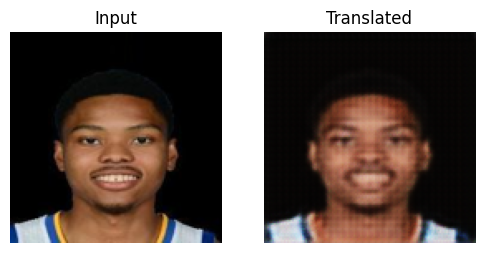

Epoch 8/10
GenG: 3.5198, GenF: 3.4477, DiscX: 0.3831, DiscY: 0.4601


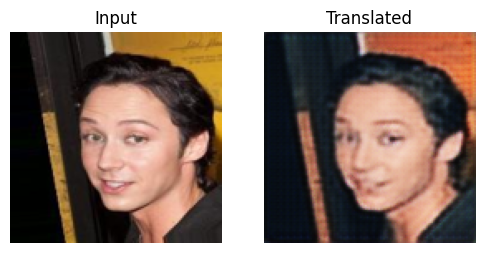

Epoch 9/10
GenG: 2.9101, GenF: 2.9119, DiscX: 0.3700, DiscY: 0.4173


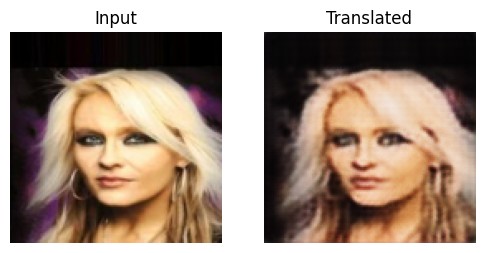

Epoch 10/10
GenG: 3.0951, GenF: 3.1096, DiscX: 0.4429, DiscY: 0.4878


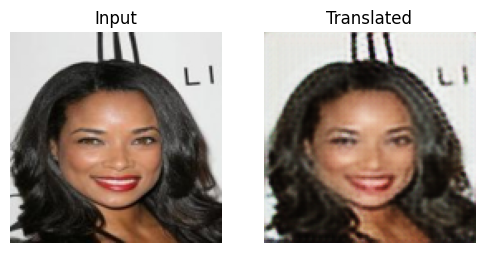

: 

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import zipfile
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

AUTOTUNE = tf.data.AUTOTUNE
IMG_SIZE = 128
BATCH_SIZE = 4
EPOCHS = 10

# =============================
# 1. Load CelebA and Split into Domain A (real) and Domain B (painted)
# =============================
def load_celeba_split(zip_path, image_size=(IMG_SIZE, IMG_SIZE), limit=1000):
    with zipfile.ZipFile(zip_path, 'r') as zf:
        image_files = sorted([f for f in zf.namelist() if f.endswith('.jpg')])[:limit]
        random.shuffle(image_files)
        half = len(image_files) // 2
        domain_a = image_files[:half]
        domain_b = image_files[half:]

        def extract_images(file_list):
            images = []
            for file in file_list:
                with zf.open(file) as f:
                    img = Image.open(f).convert('RGB').resize(image_size)
                    img = np.array(img).astype(np.float32)
                    images.append(img)
            images_np = np.stack(images)
            return (images_np / 127.5) - 1  # Normalize to [-1, 1]

        return extract_images(domain_a), extract_images(domain_b)

images_a, images_b = load_celeba_split("Datasets/img_align_celeba.zip")
train_a = tf.data.Dataset.from_tensor_slices(images_a).shuffle(1000).batch(BATCH_SIZE).prefetch(AUTOTUNE)
train_b = tf.data.Dataset.from_tensor_slices(images_b).shuffle(1000).batch(BATCH_SIZE).prefetch(AUTOTUNE)

# =============================
# 2. Generator Model (ResNet)
# =============================
def build_generator():
    inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
    x = layers.Conv2D(64, 7, padding='same')(inputs)
    x = layers.ReLU()(x)
    x = layers.Conv2D(128, 3, strides=2, padding='same')(x)
    x = layers.ReLU()(x)
    x = layers.Conv2D(256, 3, strides=2, padding='same')(x)
    x = layers.ReLU()(x)

    # 3 Residual blocks
    for _ in range(3):
        res = x
        x = layers.Conv2D(256, 3, padding='same')(x)
        x = layers.ReLU()(x)
        x = layers.Conv2D(256, 3, padding='same')(x)
        x = layers.Add()([x, res])

    x = layers.Conv2DTranspose(128, 3, strides=2, padding='same')(x)
    x = layers.ReLU()(x)
    x = layers.Conv2DTranspose(64, 3, strides=2, padding='same')(x)
    x = layers.ReLU()(x)
    outputs = layers.Conv2D(3, 7, activation='tanh', padding='same')(x)
    return tf.keras.Model(inputs, outputs)

# =============================
# 3. Discriminator Model
# =============================
def build_discriminator():
    inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
    x = layers.Conv2D(64, 4, strides=2, padding='same')(inputs)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Conv2D(128, 4, strides=2, padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Conv2D(256, 4, strides=2, padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Conv2D(1, 4, padding='same')(x)
    return tf.keras.Model(inputs, x)

# =============================
# 4. Loss Functions and Optimizers
# =============================
adv_loss = tf.keras.losses.MeanSquaredError()
cycle_loss_fn = tf.keras.losses.MeanAbsoluteError()

generator_g = build_generator()  # A → B
generator_f = build_generator()  # B → A
discriminator_x = build_discriminator()  # A
discriminator_y = build_discriminator()  # B

gen_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
gen_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
disc_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
disc_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

# =============================
# 5. Training Step
# =============================
@tf.function
def train_step(real_x, real_y):
    with tf.GradientTape(persistent=True) as tape:
        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)
        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)

        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)

        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)
        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)

        gen_g_loss = adv_loss(tf.ones_like(disc_fake_y), disc_fake_y)
        gen_f_loss = adv_loss(tf.ones_like(disc_fake_x), disc_fake_x)

        cycle_loss = cycle_loss_fn(real_x, cycled_x) + cycle_loss_fn(real_y, cycled_y)
        identity_loss = cycle_loss_fn(real_x, same_x) + cycle_loss_fn(real_y, same_y)

        total_gen_g = gen_g_loss + 10 * cycle_loss + 5 * identity_loss
        total_gen_f = gen_f_loss + 10 * cycle_loss + 5 * identity_loss

        disc_x_loss = adv_loss(tf.ones_like(disc_real_x), disc_real_x) + adv_loss(tf.zeros_like(disc_fake_x), disc_fake_x)
        disc_y_loss = adv_loss(tf.ones_like(disc_real_y), disc_real_y) + adv_loss(tf.zeros_like(disc_fake_y), disc_fake_y)

    gen_g_grads = tape.gradient(total_gen_g, generator_g.trainable_variables)
    gen_f_grads = tape.gradient(total_gen_f, generator_f.trainable_variables)
    disc_x_grads = tape.gradient(disc_x_loss, discriminator_x.trainable_variables)
    disc_y_grads = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)

    gen_g_optimizer.apply_gradients(zip(gen_g_grads, generator_g.trainable_variables))
    gen_f_optimizer.apply_gradients(zip(gen_f_grads, generator_f.trainable_variables))
    disc_x_optimizer.apply_gradients(zip(disc_x_grads, discriminator_x.trainable_variables))
    disc_y_optimizer.apply_gradients(zip(disc_y_grads, discriminator_y.trainable_variables))

    return total_gen_g, total_gen_f, disc_x_loss, disc_y_loss

# =============================
# 6. Training Loop + Visualization
# =============================
def generate_images(model, input_img):
    prediction = model(input_img, training=False)[0]
    plt.figure(figsize=(6,3))
    plt.subplot(1,2,1)
    plt.imshow((input_img[0]+1)/2)
    plt.title('Input')
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow((prediction+1)/2)
    plt.title('Translated')
    plt.axis('off')
    plt.show()

def train(train_a, train_b, epochs):
    for epoch in range(epochs):
        print(f"Epoch {epoch+1}/{epochs}")
        for real_x, real_y in tf.data.Dataset.zip((train_a, train_b)):
            g1, g2, d1, d2 = train_step(real_x, real_y)
        print(f"GenG: {g1:.4f}, GenF: {g2:.4f}, DiscX: {d1:.4f}, DiscY: {d2:.4f}")
        generate_images(generator_g, real_x)

train(train_a, train_b, epochs=EPOCHS)

2025-08-04 20:17:46.217600: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-08-04 20:17:46.217625: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-08-04 20:17:46.218644: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-08-04 20:17:46.225836: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-08-04 20:17:46.967922: W tensorflow/compiler/tf2

Epoch 1/10


2025-08-04 20:17:56.585690: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8907
2025-08-04 20:17:59.009928: I external/local_xla/xla/service/service.cc:168] XLA service 0x758e7df22600 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-08-04 20:17:59.009953: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce GTX 1070, Compute Capability 6.1
2025-08-04 20:17:59.014186: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1754317079.094455   78703 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


GenG: 5.4921, GenF: 5.3219, DiscX: 0.4456, DiscY: 0.4025


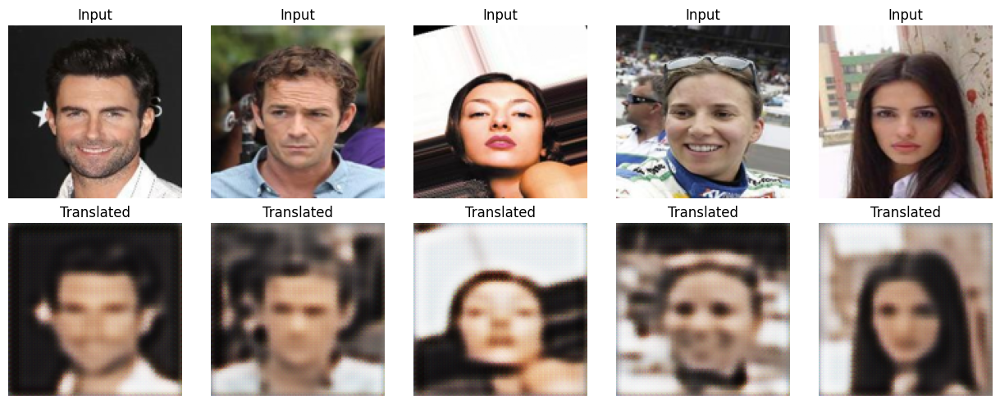

Epoch 2/10
GenG: 4.1000, GenF: 3.8689, DiscX: 0.4833, DiscY: 0.4933


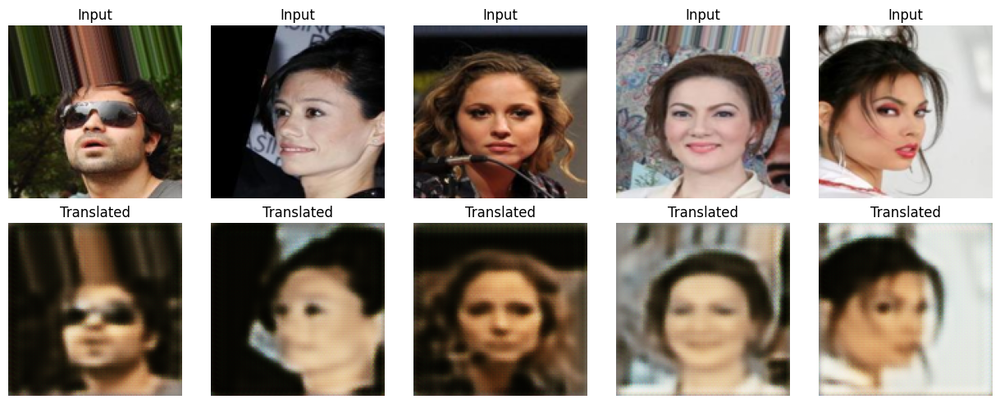

Epoch 3/10
GenG: 4.2819, GenF: 4.2740, DiscX: 0.4345, DiscY: 0.5384


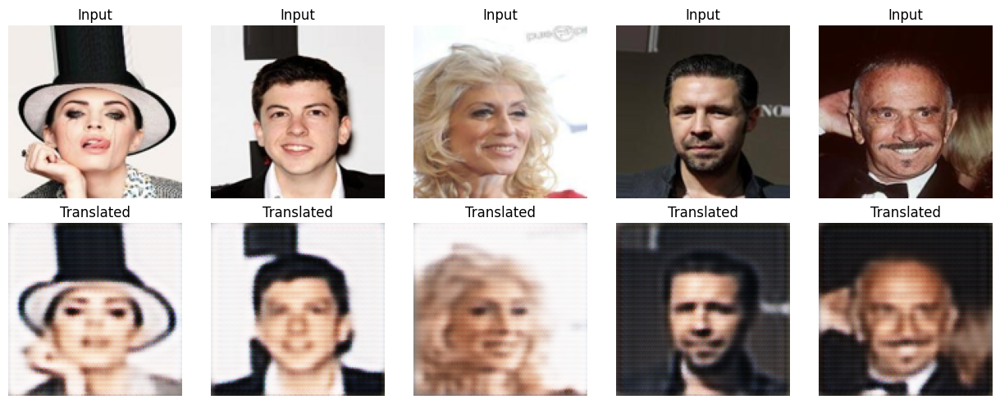

Epoch 4/10
GenG: 3.9771, GenF: 3.9998, DiscX: 0.4618, DiscY: 0.4251


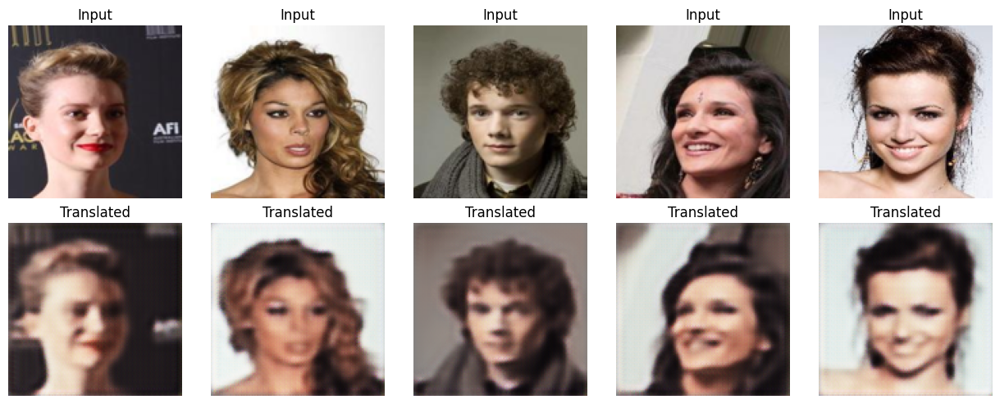

Epoch 5/10
GenG: 3.8558, GenF: 3.8414, DiscX: 0.3566, DiscY: 0.5111


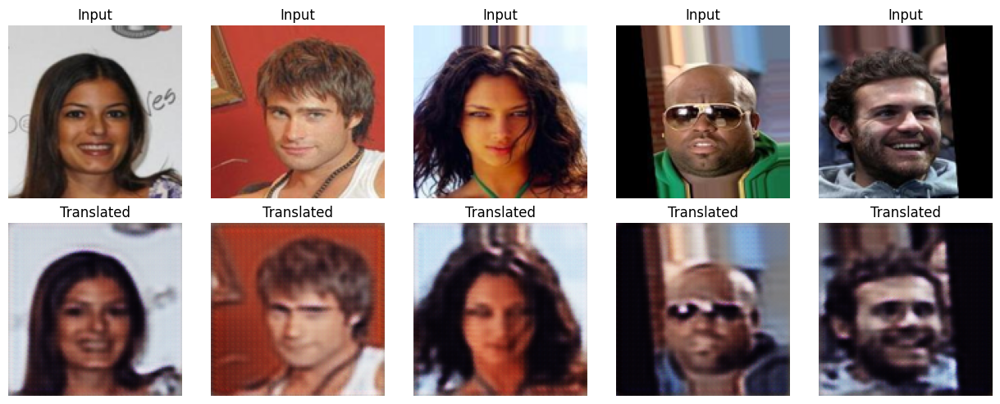

Epoch 6/10
GenG: 3.2609, GenF: 3.2799, DiscX: 0.4516, DiscY: 0.3737


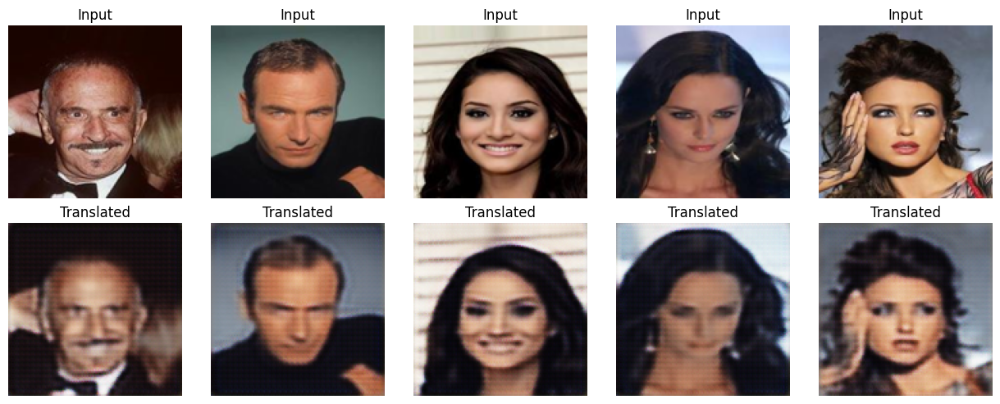

Epoch 7/10
GenG: 3.5570, GenF: 3.5814, DiscX: 0.4164, DiscY: 0.3721


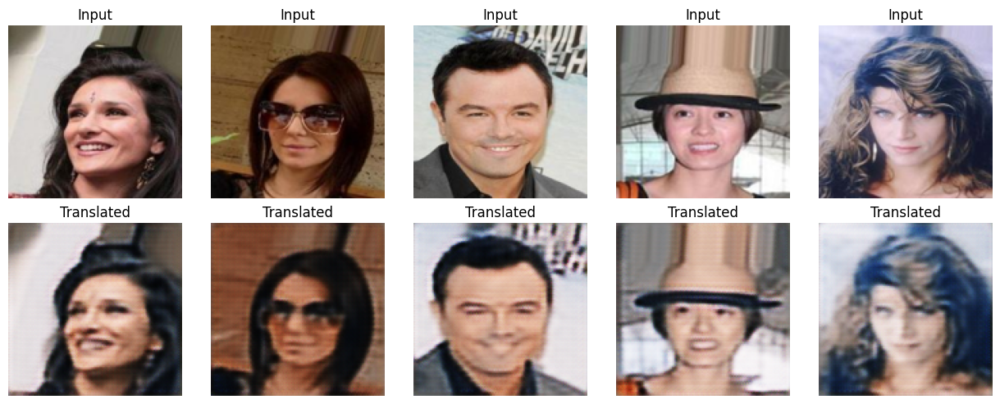

Epoch 8/10
GenG: 3.3203, GenF: 3.3206, DiscX: 0.4247, DiscY: 0.4201


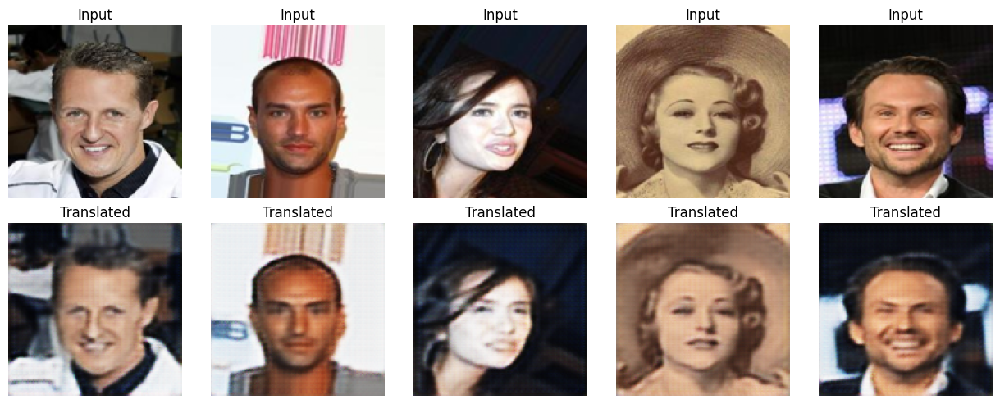

Epoch 9/10
GenG: 3.0142, GenF: 3.1721, DiscX: 0.3899, DiscY: 0.5295


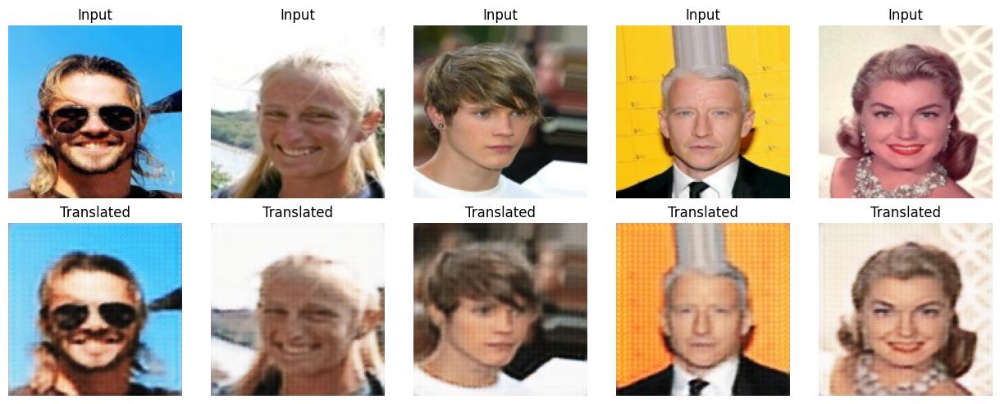

Epoch 10/10
GenG: 2.8159, GenF: 2.8514, DiscX: 0.3823, DiscY: 0.4860


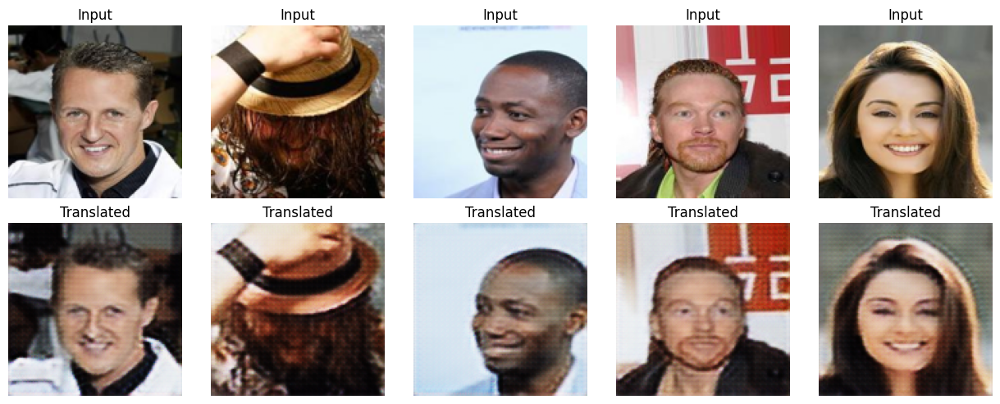

: 

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import zipfile
import random
from PIL import Image
import matplotlib.pyplot as plt

# =============================
# 0. Config
# =============================
AUTOTUNE = tf.data.AUTOTUNE
IMG_SIZE = 128
BATCH_SIZE = 5  # Ensure 5 images for visualization
EPOCHS = 10

# =============================
# 1. Load CelebA and Split into Domain A and B
# =============================
def load_celeba_split(zip_path, image_size=(IMG_SIZE, IMG_SIZE), limit=1000):
    with zipfile.ZipFile(zip_path, 'r') as zf:
        image_files = sorted([f for f in zf.namelist() if f.endswith('.jpg')])[:limit]
        random.shuffle(image_files)
        half = len(image_files) // 2
        domain_a = image_files[:half]
        domain_b = image_files[half:]

        def extract_images(file_list):
            images = []
            for file in file_list:
                with zf.open(file) as f:
                    img = Image.open(f).convert('RGB').resize(image_size)
                    img = np.array(img).astype(np.float32)
                    images.append(img)
            images_np = np.stack(images)
            return (images_np / 127.5) - 1  # Normalize to [-1, 1]

        return extract_images(domain_a), extract_images(domain_b)

images_a, images_b = load_celeba_split("Datasets/img_align_celeba.zip")
train_a = tf.data.Dataset.from_tensor_slices(images_a).shuffle(1000).batch(BATCH_SIZE).prefetch(AUTOTUNE)
train_b = tf.data.Dataset.from_tensor_slices(images_b).shuffle(1000).batch(BATCH_SIZE).prefetch(AUTOTUNE)

# =============================
# 2. Generator Model
# =============================
def build_generator():
    inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
    x = layers.Conv2D(64, 7, padding='same')(inputs)
    x = layers.ReLU()(x)
    x = layers.Conv2D(128, 3, strides=2, padding='same')(x)
    x = layers.ReLU()(x)
    x = layers.Conv2D(256, 3, strides=2, padding='same')(x)
    x = layers.ReLU()(x)

    for _ in range(3):
        res = x
        x = layers.Conv2D(256, 3, padding='same')(x)
        x = layers.ReLU()(x)
        x = layers.Conv2D(256, 3, padding='same')(x)
        x = layers.Add()([x, res])

    x = layers.Conv2DTranspose(128, 3, strides=2, padding='same')(x)
    x = layers.ReLU()(x)
    x = layers.Conv2DTranspose(64, 3, strides=2, padding='same')(x)
    x = layers.ReLU()(x)
    outputs = layers.Conv2D(3, 7, activation='tanh', padding='same')(x)
    return tf.keras.Model(inputs, outputs)

# =============================
# 3. Discriminator Model
# =============================
def build_discriminator():
    inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
    x = layers.Conv2D(64, 4, strides=2, padding='same')(inputs)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Conv2D(128, 4, strides=2, padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Conv2D(256, 4, strides=2, padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Conv2D(1, 4, padding='same')(x)
    return tf.keras.Model(inputs, x)

# =============================
# 4. Losses and Optimizers
# =============================
adv_loss = tf.keras.losses.MeanSquaredError()
cycle_loss_fn = tf.keras.losses.MeanAbsoluteError()

generator_g = build_generator()  # A → B
generator_f = build_generator()  # B → A
discriminator_x = build_discriminator()  # A
discriminator_y = build_discriminator()  # B

gen_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
gen_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
disc_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
disc_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

# =============================
# 5. Training Step
# =============================
@tf.function
def train_step(real_x, real_y):
    with tf.GradientTape(persistent=True) as tape:
        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)
        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)

        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)

        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)
        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)

        gen_g_loss = adv_loss(tf.ones_like(disc_fake_y), disc_fake_y)
        gen_f_loss = adv_loss(tf.ones_like(disc_fake_x), disc_fake_x)

        cycle_loss = cycle_loss_fn(real_x, cycled_x) + cycle_loss_fn(real_y, cycled_y)
        identity_loss = cycle_loss_fn(real_x, same_x) + cycle_loss_fn(real_y, same_y)

        total_gen_g = gen_g_loss + 10 * cycle_loss + 5 * identity_loss
        total_gen_f = gen_f_loss + 10 * cycle_loss + 5 * identity_loss

        disc_x_loss = adv_loss(tf.ones_like(disc_real_x), disc_real_x) + adv_loss(tf.zeros_like(disc_fake_x), disc_fake_x)
        disc_y_loss = adv_loss(tf.ones_like(disc_real_y), disc_real_y) + adv_loss(tf.zeros_like(disc_fake_y), disc_fake_y)

    gen_g_grads = tape.gradient(total_gen_g, generator_g.trainable_variables)
    gen_f_grads = tape.gradient(total_gen_f, generator_f.trainable_variables)
    disc_x_grads = tape.gradient(disc_x_loss, discriminator_x.trainable_variables)
    disc_y_grads = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)

    gen_g_optimizer.apply_gradients(zip(gen_g_grads, generator_g.trainable_variables))
    gen_f_optimizer.apply_gradients(zip(gen_f_grads, generator_f.trainable_variables))
    disc_x_optimizer.apply_gradients(zip(disc_x_grads, discriminator_x.trainable_variables))
    disc_y_optimizer.apply_gradients(zip(disc_y_grads, discriminator_y.trainable_variables))

    return total_gen_g, total_gen_f, disc_x_loss, disc_y_loss

# =============================
# 6. Visualization: 5 Images Grid
# =============================
def generate_images(model, input_batch, num_images=5):
    predictions = model(input_batch, training=False)
    plt.figure(figsize=(num_images * 2.5, 5))

    for i in range(num_images):
        plt.subplot(2, num_images, i + 1)
        plt.imshow((input_batch[i] + 1) / 2)
        plt.title("Input")
        plt.axis('off')

        plt.subplot(2, num_images, num_images + i + 1)
        plt.imshow((predictions[i] + 1) / 2)
        plt.title("Translated")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# =============================
# 7. Training Loop
# =============================
def train(train_a, train_b, epochs):
    for epoch in range(epochs):
        print(f"Epoch {epoch+1}/{epochs}")
        for real_x, real_y in tf.data.Dataset.zip((train_a, train_b)):
            g1, g2, d1, d2 = train_step(real_x, real_y)
        print(f"GenG: {g1:.4f}, GenF: {g2:.4f}, DiscX: {d1:.4f}, DiscY: {d2:.4f}")
        generate_images(generator_g, real_x, num_images=5)

train(train_a, train_b, epochs=EPOCHS)


2025-08-04 20:23:59.148133: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-08-04 20:23:59.148162: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-08-04 20:23:59.149286: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-08-04 20:23:59.155688: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-08-04 20:23:59.887367: W tensorflow/compiler/tf2

Epoch 1/10


2025-08-04 20:24:09.567233: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8907
2025-08-04 20:24:13.983402: I external/local_xla/xla/service/service.cc:168] XLA service 0x75ba66f95030 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-08-04 20:24:13.983433: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce GTX 1070, Compute Capability 6.1
2025-08-04 20:24:13.990196: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1754317454.094568   82011 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


GenG: 4.5588, GenF: 4.7721, DiscX: 0.4105, DiscY: 0.4743


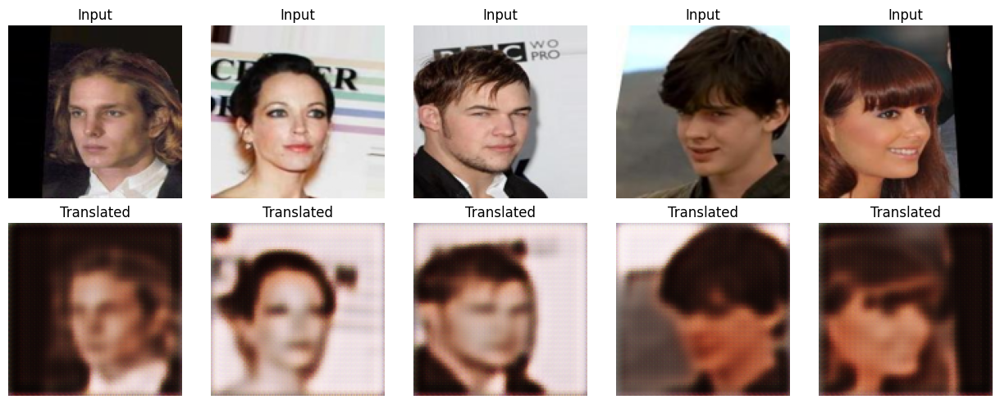

Epoch 2/10
GenG: 6.4836, GenF: 6.4360, DiscX: 0.5537, DiscY: 0.4418


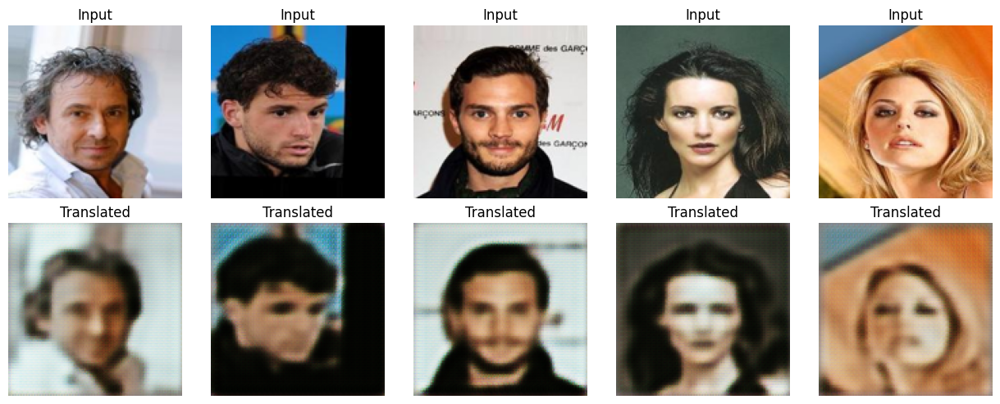

Epoch 3/10
GenG: 3.8764, GenF: 4.1351, DiscX: 0.4491, DiscY: 0.3964


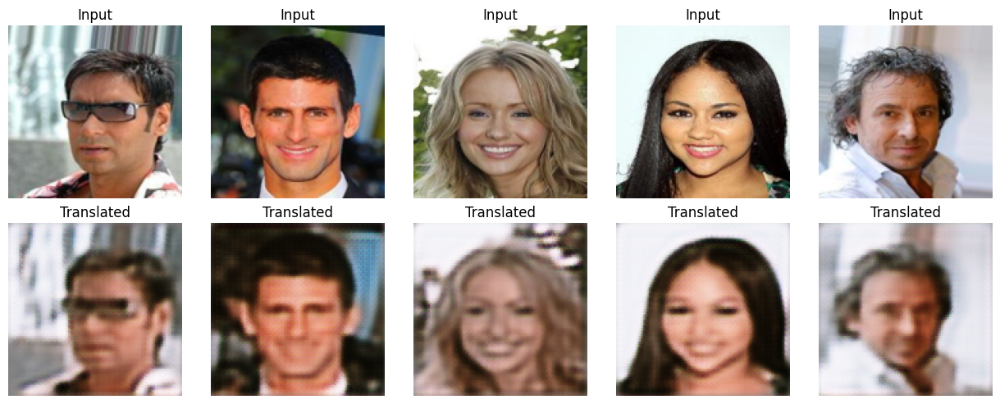

Epoch 4/10
GenG: 3.5022, GenF: 3.5002, DiscX: 0.5452, DiscY: 0.3730


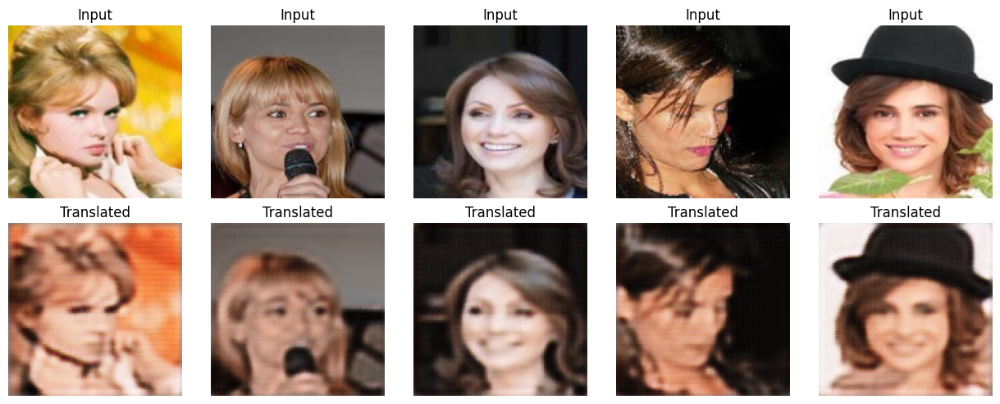

Epoch 5/10
GenG: 4.0203, GenF: 3.8832, DiscX: 0.5960, DiscY: 0.3837


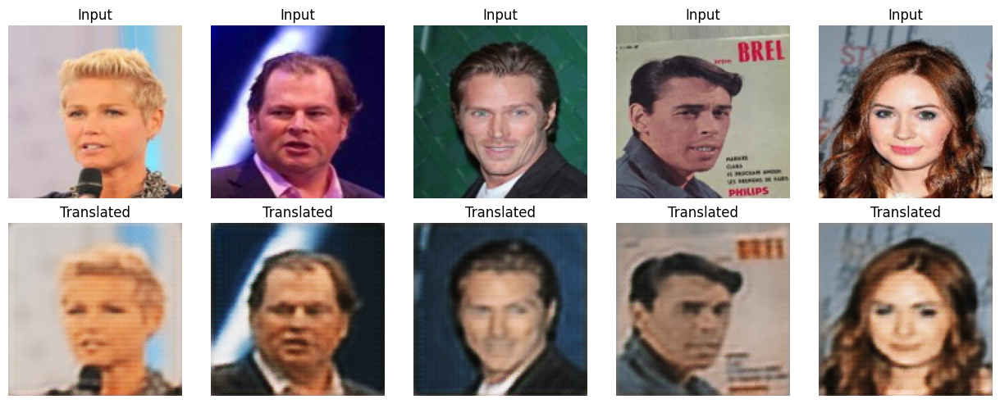

Epoch 6/10
GenG: 3.6375, GenF: 3.6011, DiscX: 0.4030, DiscY: 0.4287


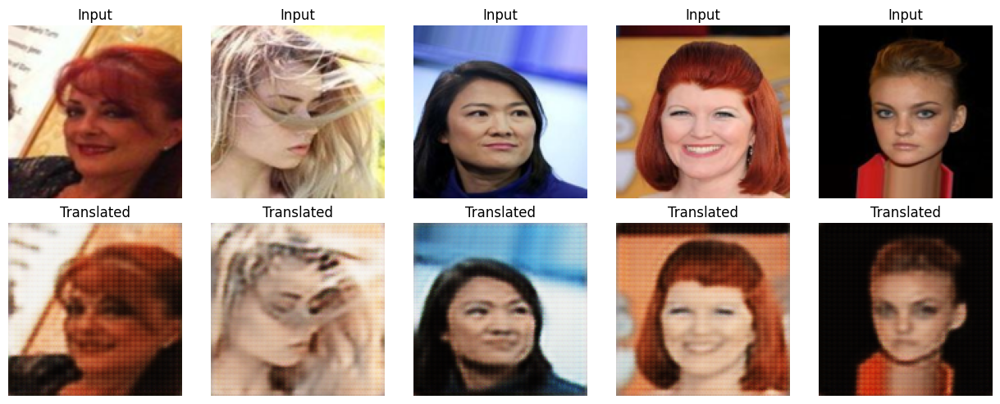

Epoch 7/10
GenG: 3.1380, GenF: 3.0252, DiscX: 0.4405, DiscY: 0.4207


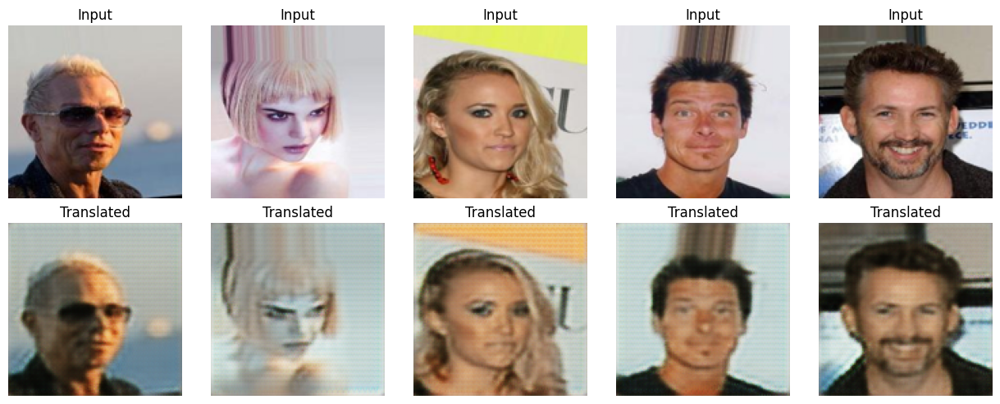

Epoch 8/10
GenG: 2.8822, GenF: 2.8550, DiscX: 0.4425, DiscY: 0.3836


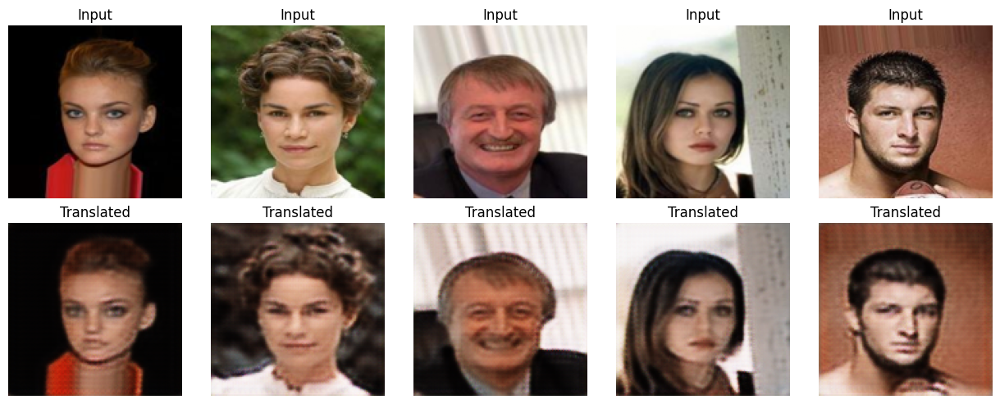

Epoch 9/10
GenG: 3.0114, GenF: 2.8242, DiscX: 0.3447, DiscY: 0.4657


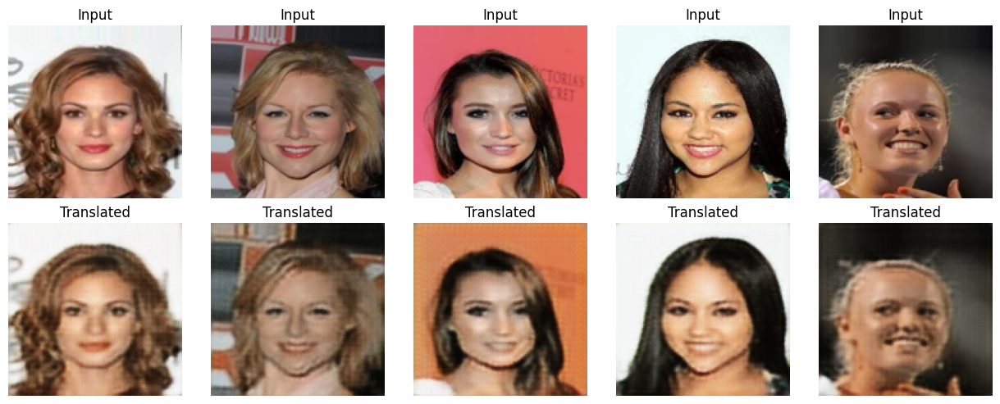

Epoch 10/10
GenG: 3.0911, GenF: 3.0384, DiscX: 0.5233, DiscY: 0.4342


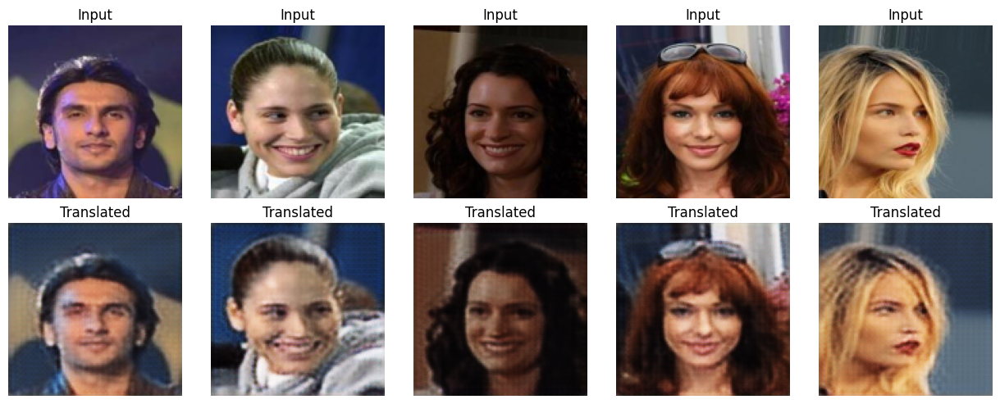

: 

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import zipfile
import random
from PIL import Image
import matplotlib.pyplot as plt

# =============================
# 0. Config
# =============================
AUTOTUNE = tf.data.AUTOTUNE
IMG_SIZE = 128
BATCH_SIZE = 5    # set >=5
EPOCHS = 10

# =============================
# 1. Load CelebA and Split into Domain A (real) and Domain B (painted)
# =============================
def load_celeba_split(zip_path, image_size=(IMG_SIZE, IMG_SIZE), limit=1000):
    with zipfile.ZipFile(zip_path, 'r') as zf:
        image_files = sorted([f for f in zf.namelist() if f.endswith('.jpg')])[:limit]
        random.shuffle(image_files)
        half = len(image_files) // 2
        domain_a = image_files[:half]
        domain_b = image_files[half:]

        def extract_images(file_list):
            images = []
            for file in file_list:
                with zf.open(file) as f:
                    img = Image.open(f).convert('RGB').resize(image_size)
                    img = np.array(img).astype(np.float32)
                    images.append(img)
            images_np = np.stack(images)
            return (images_np / 127.5) - 1  # Normalize to [-1, 1]

        return extract_images(domain_a), extract_images(domain_b)

images_a, images_b = load_celeba_split("Datasets/img_align_celeba.zip")
train_a = tf.data.Dataset.from_tensor_slices(images_a).shuffle(1000).batch(BATCH_SIZE).prefetch(AUTOTUNE)
train_b = tf.data.Dataset.from_tensor_slices(images_b).shuffle(1000).batch(BATCH_SIZE).prefetch(AUTOTUNE)

# =============================
# 2. Generator Model (ResNet)
# =============================
def build_generator():
    inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
    x = layers.Conv2D(64, 7, padding='same')(inputs)
    x = layers.ReLU()(x)
    x = layers.Conv2D(128, 3, strides=2, padding='same')(x)
    x = layers.ReLU()(x)
    x = layers.Conv2D(256, 3, strides=2, padding='same')(x)
    x = layers.ReLU()(x)

    # 3 Residual blocks
    for _ in range(3):
        res = x
        x = layers.Conv2D(256, 3, padding='same')(x)
        x = layers.ReLU()(x)
        x = layers.Conv2D(256, 3, padding='same')(x)
        x = layers.Add()([x, res])

    x = layers.Conv2DTranspose(128, 3, strides=2, padding='same')(x)
    x = layers.ReLU()(x)
    x = layers.Conv2DTranspose(64, 3, strides=2, padding='same')(x)
    x = layers.ReLU()(x)
    outputs = layers.Conv2D(3, 7, activation='tanh', padding='same')(x)
    return tf.keras.Model(inputs, outputs)

# =============================
# 3. Discriminator Model
# =============================
def build_discriminator():
    inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
    x = layers.Conv2D(64, 4, strides=2, padding='same')(inputs)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Conv2D(128, 4, strides=2, padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Conv2D(256, 4, strides=2, padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Conv2D(1, 4, padding='same')(x)
    return tf.keras.Model(inputs, x)

# =============================
# 4. Loss Functions and Optimizers
# =============================
adv_loss = tf.keras.losses.MeanSquaredError()
cycle_loss_fn = tf.keras.losses.MeanAbsoluteError()

generator_g = build_generator()  # A → B
generator_f = build_generator()  # B → A
discriminator_x = build_discriminator()  # A
discriminator_y = build_discriminator()  # B

gen_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
gen_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
disc_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
disc_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

# =============================
# 5. Training Step
# =============================
@tf.function
def train_step(real_x, real_y):
    with tf.GradientTape(persistent=True) as tape:
        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)
        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)

        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)

        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)
        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)

        gen_g_loss = adv_loss(tf.ones_like(disc_fake_y), disc_fake_y)
        gen_f_loss = adv_loss(tf.ones_like(disc_fake_x), disc_fake_x)

        cycle_loss = cycle_loss_fn(real_x, cycled_x) + cycle_loss_fn(real_y, cycled_y)
        identity_loss = cycle_loss_fn(real_x, same_x) + cycle_loss_fn(real_y, same_y)

        total_gen_g = gen_g_loss + 10 * cycle_loss + 5 * identity_loss
        total_gen_f = gen_f_loss + 10 * cycle_loss + 5 * identity_loss

        disc_x_loss = adv_loss(tf.ones_like(disc_real_x), disc_real_x) + adv_loss(tf.zeros_like(disc_fake_x), disc_fake_x)
        disc_y_loss = adv_loss(tf.ones_like(disc_real_y), disc_real_y) + adv_loss(tf.zeros_like(disc_fake_y), disc_fake_y)

    gen_g_grads = tape.gradient(total_gen_g, generator_g.trainable_variables)
    gen_f_grads = tape.gradient(total_gen_f, generator_f.trainable_variables)
    disc_x_grads = tape.gradient(disc_x_loss, discriminator_x.trainable_variables)
    disc_y_grads = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)

    gen_g_optimizer.apply_gradients(zip(gen_g_grads, generator_g.trainable_variables))
    gen_f_optimizer.apply_gradients(zip(gen_f_grads, generator_f.trainable_variables))
    disc_x_optimizer.apply_gradients(zip(disc_x_grads, discriminator_x.trainable_variables))
    disc_y_optimizer.apply_gradients(zip(disc_y_grads, discriminator_y.trainable_variables))

    return total_gen_g, total_gen_f, disc_x_loss, disc_y_loss

# =============================
# 6. 5-Image Visualization
# =============================
def generate_images(model, input_batch, num_images=5):
    predictions = model(input_batch, training=False)
    plt.figure(figsize=(num_images * 2.5, 5))
    for i in range(num_images):
        plt.subplot(2, num_images, i + 1)
        plt.imshow((input_batch[i] + 1) / 2)
        plt.title("Input")
        plt.axis('off')

        plt.subplot(2, num_images, num_images + i + 1)
        plt.imshow((predictions[i] + 1) / 2)
        plt.title("Translated")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# =============================
# 7. Training Loop
# =============================
def train(train_a, train_b, epochs):
    for epoch in range(epochs):
        print(f"Epoch {epoch+1}/{epochs}")
        for real_x, real_y in tf.data.Dataset.zip((train_a, train_b)):
            g1, g2, d1, d2 = train_step(real_x, real_y)
        print(f"GenG: {g1:.4f}, GenF: {g2:.4f}, DiscX: {d1:.4f}, DiscY: {d2:.4f}")
        generate_images(generator_g, real_x, num_images=5)

train(train_a, train_b, epochs=EPOCHS)
